In [1]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt


# Read Data and View

Data can be read with pandas without any modification.

Each row of 'restaurants.csv' contains information for a single restaurant; with an unique id given by 'location_id'

Each row of 'subscription.csv' contains a location id with information about if and when subscribed.

In [2]:
# read data and view
restaurants_df = pd.read_csv('tarball/restaurants.csv')
subscription_df = pd.read_csv('tarball/subscription.csv')
restaurants_df['ds'] = pd.to_datetime(restaurants_df['ds'])
subscription_df['start_date'] = pd.to_datetime(subscription_df['start_date'])
subscription_df['end_date'] = pd.to_datetime(subscription_df['end_date'])

display(restaurants_df)
display(subscription_df)
display(restaurants_df.dtypes)
display(subscription_df.dtypes)

,location_id,continent,country,days_since_abandoned_cart,days_since_last_email,email_delivered_last_month,email_opens_last_month,manage_listings_last_month,manage_photos_last_month,visitor_calls_last_month,...,days_since_creation,days_since_claim,geo_rank,geo_rank_all,photos,rating,days_since_last_review,reviews,uniques,ds
0,387613,North America,United States,NaN,NaN,NaN,NaN,0.0,0.0,0.0,...,NaN,1356,1083.0,1265,NaN,NaN,1082.0,1.0,25.0,2022-01-01
1,389552,North America,United States,NaN,11.0,12.0,2.0,0.0,0.0,6.0,...,NaN,2185,9.0,699,145.0,9.0,189.0,844.0,6288.0,2022-01-01
2,389652,North America,United States,NaN,11.0,10.0,1.0,0.0,0.0,1.0,...,NaN,495,10.0,159,12.0,8.0,46.0,158.0,2114.0,2022-01-01
3,389672,North America,United States,NaN,194.0,0.0,0.0,0.0,0.0,3.0,...,NaN,821,36.0,699,188.0,8.0,13.0,653.0,3517.0,2022-01-01
4,391085,North America,United States,NaN,26.0,1.0,0.0,0.0,0.0,2.0,...,NaN,501,9.0,155,58.0,8.0,16.0,342.0,2156.0,2022-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212464,4912670,Europe,United Kingdom,NaN,163.0,0.0,0.0,0.0,0.0,3.0,...,3026.0,1008,26.0,57,1.0,9.0,226.0,27.0,2054.0,2022-01-01
1212465,4914968,South Pacific,Australia,NaN,11.0,3.0,0.0,0.0,0.0,1.0,...,3025.0,1161,43.0,83,22.0,8.0,13.0,277.0,1167.0,2022-01-01
1212466,4916029,North America,United States,NaN,21.0,6.0,4.0,0.0,0.0,0.0,...,3025.0,1077,321.0,536,14.0,8.0,259.0,18.0,472.0,2022-01-01
1212467,4916574,North America,United States,NaN,11.0,12.0,0.0,0.0,0.0,0.0,...,3025.0,2155,1.0,6,34.0,8.0,532.0,53.0,648.0,2022-01-01


,location_id,is_active,start_date,end_date
0,16674437,1,2022-01-08,2022-02-08
1,4276431,1,2022-01-22,2022-02-22
2,15658775,1,2022-01-07,2022-02-07
3,23423429,1,2022-01-19,2022-02-19
4,23526626,1,2022-01-06,2022-02-06
...,...,...,...,...
7198,2230006,1,2022-01-15,2022-02-15
7199,7258843,1,2022-01-21,2022-02-21
7200,20266499,1,2022-01-20,2022-02-20
7201,23330771,1,2022-01-26,2022-02-26


location_id                                   int64
continent                                    object
country                                      object
days_since_abandoned_cart                   float64
days_since_last_email                       float64
email_delivered_last_month                  float64
email_opens_last_month                      float64
manage_listings_last_month                  float64
manage_photos_last_month                    float64
visitor_calls_last_month                    float64
visitor_reservations_last_month             float64
visitor_saves_last_month                    float64
visitor_website_clicks_last_month           float64
awards                                      float64
days_since_creation                         float64
days_since_claim                              int64
geo_rank                                    float64
geo_rank_all                                  int64
photos                                      float64
rating      

location_id             int64
is_active               int64
start_date     datetime64[ns]
end_date       datetime64[ns]
dtype: object

In [3]:
# merge subscriptions
merged_df = restaurants_df.merge(subscription_df, how='left', on='location_id')
# double check merge
display(restaurants_df.shape)
display(merged_df.shape)
display(merged_df)

(1212469, 24)

(1212469, 27)

,location_id,continent,country,days_since_abandoned_cart,days_since_last_email,email_delivered_last_month,email_opens_last_month,manage_listings_last_month,manage_photos_last_month,visitor_calls_last_month,...,geo_rank_all,photos,rating,days_since_last_review,reviews,uniques,ds,is_active,start_date,end_date
0,387613,North America,United States,NaN,NaN,NaN,NaN,0.0,0.0,0.0,...,1265,NaN,NaN,1082.0,1.0,25.0,2022-01-01,NaN,NaT,NaT
1,389552,North America,United States,NaN,11.0,12.0,2.0,0.0,0.0,6.0,...,699,145.0,9.0,189.0,844.0,6288.0,2022-01-01,NaN,NaT,NaT
2,389652,North America,United States,NaN,11.0,10.0,1.0,0.0,0.0,1.0,...,159,12.0,8.0,46.0,158.0,2114.0,2022-01-01,NaN,NaT,NaT
3,389672,North America,United States,NaN,194.0,0.0,0.0,0.0,0.0,3.0,...,699,188.0,8.0,13.0,653.0,3517.0,2022-01-01,NaN,NaT,NaT
4,391085,North America,United States,NaN,26.0,1.0,0.0,0.0,0.0,2.0,...,155,58.0,8.0,16.0,342.0,2156.0,2022-01-01,NaN,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212464,4912670,Europe,United Kingdom,NaN,163.0,0.0,0.0,0.0,0.0,3.0,...,57,1.0,9.0,226.0,27.0,2054.0,2022-01-01,NaN,NaT,NaT
1212465,4914968,South Pacific,Australia,NaN,11.0,3.0,0.0,0.0,0.0,1.0,...,83,22.0,8.0,13.0,277.0,1167.0,2022-01-01,NaN,NaT,NaT
1212466,4916029,North America,United States,NaN,21.0,6.0,4.0,0.0,0.0,0.0,...,536,14.0,8.0,259.0,18.0,472.0,2022-01-01,NaN,NaT,NaT
1212467,4916574,North America,United States,NaN,11.0,12.0,0.0,0.0,0.0,0.0,...,6,34.0,8.0,532.0,53.0,648.0,2022-01-01,NaN,NaT,NaT


# EDA

- Univariate Analysis
- Multivariate Analysis
- Data Cleaning
- Data Formatting

I usually decide to do data cleaning and formatting last in the EDA. During the process of observing the data I may see approaches for encoding missing, scaling, etc.

## Univariate Analysis

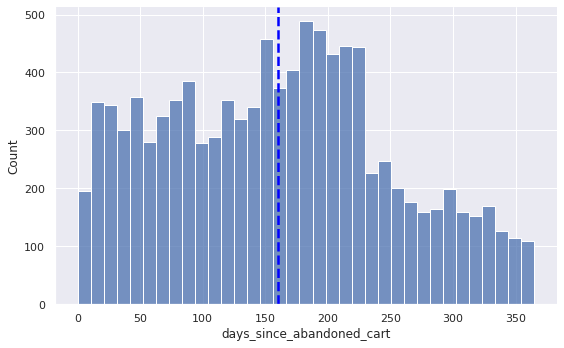

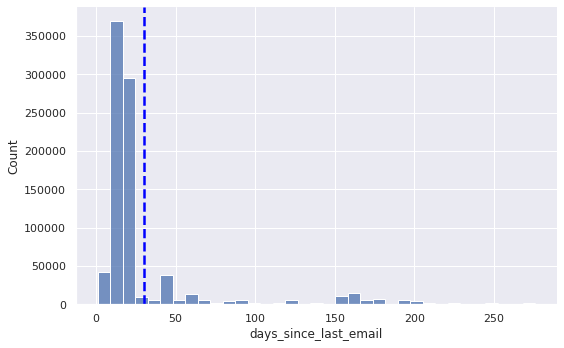

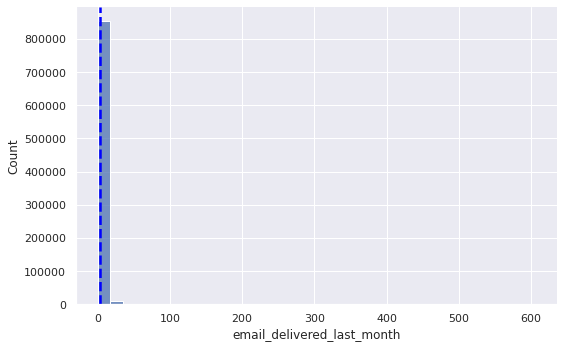

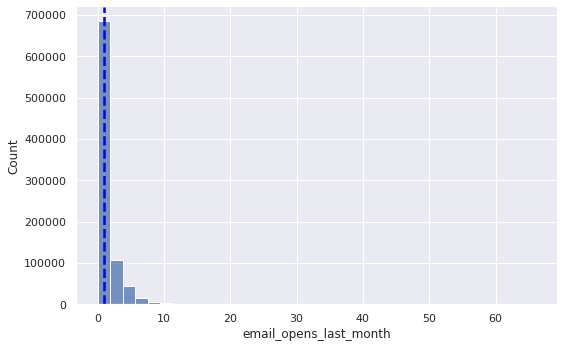

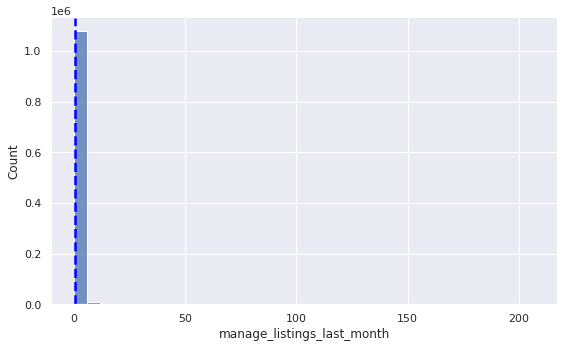

...

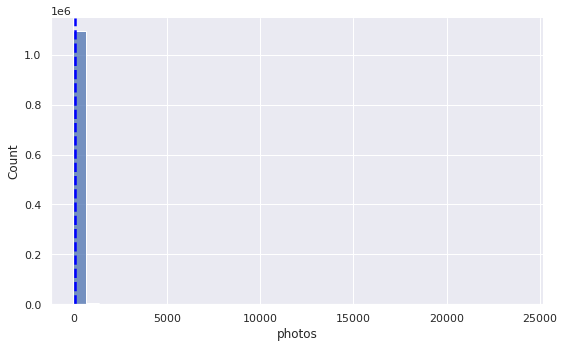

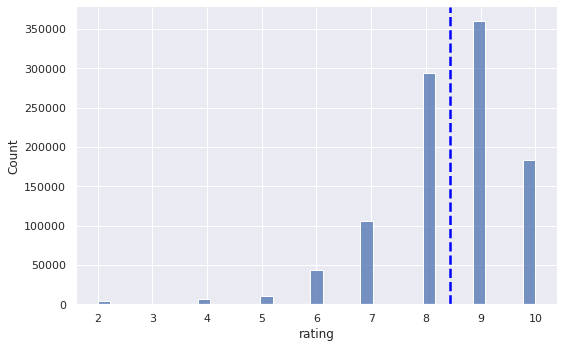

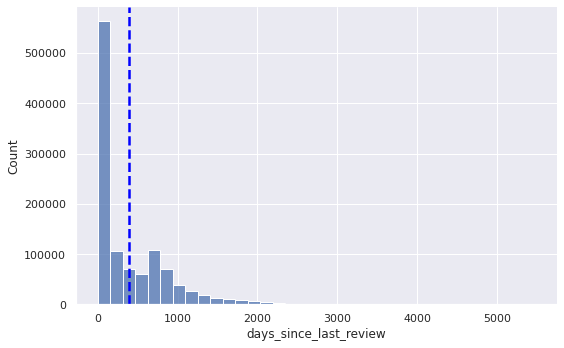

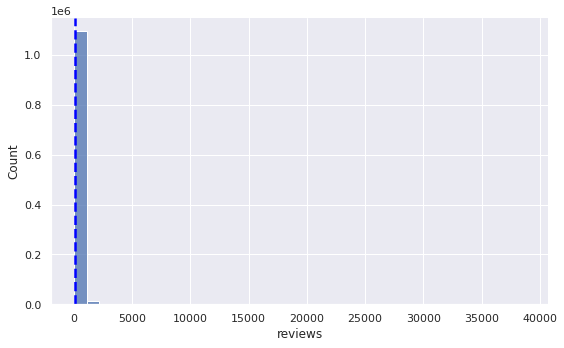

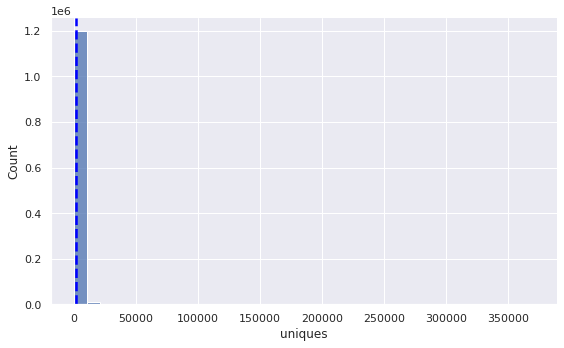

In [4]:
# plotting distribution histograms firstly for numeric columns
# and dotted blue line shows mean value
sns.set(rc={'figure.figsize':(16,9)})
for col in merged_df.columns.drop(['location_id', 'start_date', 'end_date', 'is_active']):
    if pd.api.types.is_numeric_dtype(merged_df[col].dtype):
        sns.displot(merged_df[col], bins=35, aspect=1.6)
        plt.axvline(x=merged_df[col].mean(),
        color='blue',
        ls='--', 
        lw=2.5)
        plt.show()
        # sns.boxplot(merged_df[col])

Europe             640424
North America      260922
Asia               153691
South America       81081
South Pacific       37959
Africa              18575
Middle East         12796
Central America      7021
Name: continent, dtype: int64

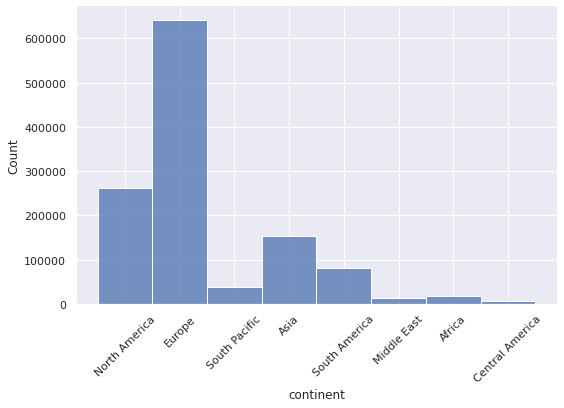

In [5]:
# continent histogram
continent_hist = sns.displot(merged_df['continent'], aspect=1.6)
display(merged_df['continent'].value_counts())
continent_hist.set_xticklabels(rotation=45)

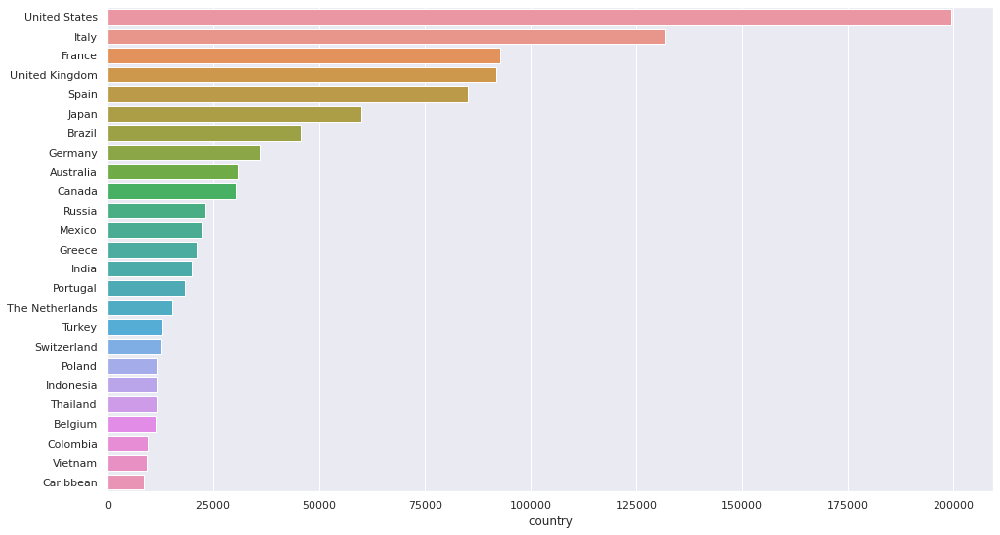

In [6]:
plot_data = merged_df['country'].value_counts()[:25]
top_country_plot = sns.barplot(y=plot_data.index, x=plot_data)
plt.show()

31     6248
365     459
29      203
28      198
30       95
dtype: int64

<AxesSubplot:>

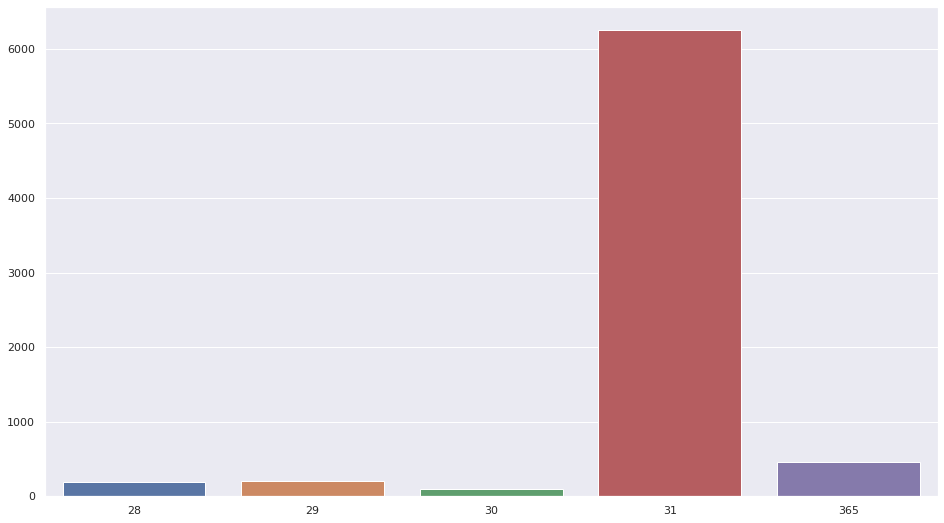

In [7]:
# plot subsciption length counts
subscription_length = subscription_df['end_date'] - subscription_df['start_date']
plot_data = (subscription_length).dt.days.value_counts()
display(plot_data)
sns.barplot(x=plot_data.index, y=plot_data)

<AxesSubplot:xlabel='start_date'>

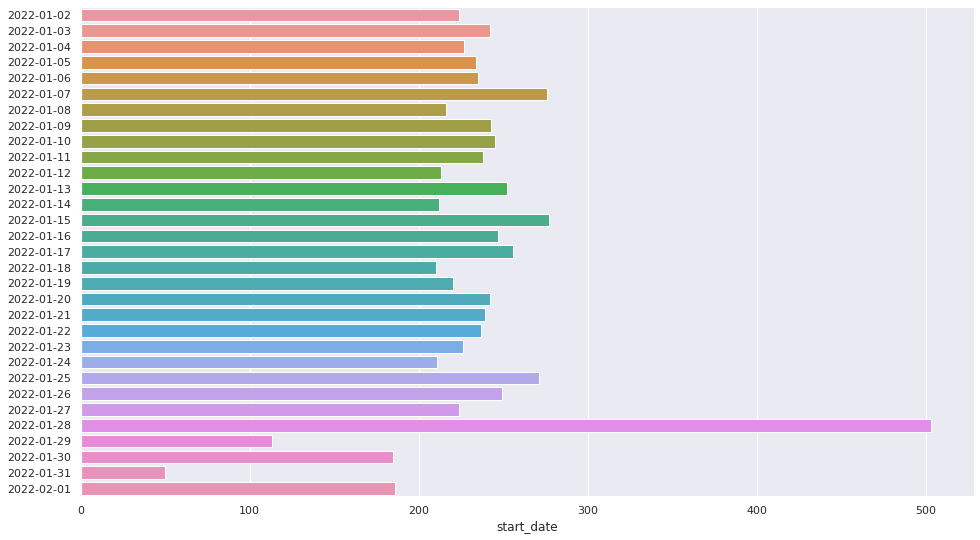

In [8]:
# plot start date distribution
plot_data = (subscription_df['start_date'] - subscription_df['start_date'].min()).dt.days
plot_data = plot_data.value_counts().sort_index()
plot_x_labels = [(subscription_df['start_date'].min() + datetime.timedelta(days=i)).date() for i in plot_data.index]
sns.barplot(y=plot_x_labels, x=plot_data)

<AxesSubplot:xlabel='end_date'>

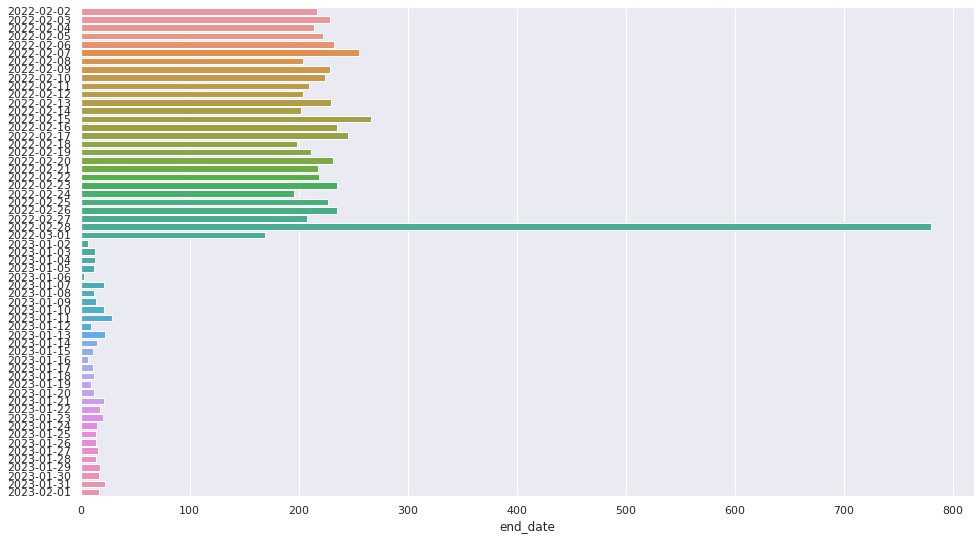

In [9]:
# plot end_date distribution
plot_data = (subscription_df['end_date'] - subscription_df['end_date'].min()).dt.days
plot_data = plot_data.value_counts().sort_index()
plot_x_labels = [(subscription_df['end_date'].min() + datetime.timedelta(days=i)).date() for i in plot_data.index]
sns.barplot(y=plot_x_labels, x=plot_data)

- Notice many varaibles have very long tailed distributions, seemingly following phenomenon such as power law. At feature engineering stage, I am to create transformations with this distribution in mind. (log, discretization)

- 'country' also seems to follow some pareto distribution. (Encoding to the count may be viable.)

- Notice 'rating' is bounded between 0 and 10.

- Notice 'days_since_abandoned_cart' is bounded between 0 and 365

- Most data from Europe > North America > Asia > South America > ...

- Notice the length of subsciptions tend be roughly a month long or a year long. I may simplify for model by encoding if month long or year long explicitly.

- Start dates range from 2022-01-02 till 2022-02-01.

- Noticable start date peak at 2022-01-28 and drops afterwards.

- Noticable end date peak at 2022-02-28, partly due to month long subsciptions from start date 2022-01-28. Potentially can set end of subsciption date to last day of month.

- Outliers exist for multiple variables including 'uniques', 'reviews', 'visitor_saves_last_month' and other other many other variables seem in the long-tail. I may decide to cap or drop outlier values.

Remaining cols to look at 'continent', 'country', 'ds'

In [10]:
# we can drop 'start_date' and 'end_date' as they only exist when premium subscription is active 
merged_df = merged_df.drop(columns=['start_date', 'end_date'])

In [11]:
# percentage null
merged_df.isnull().sum().sort_values() / restaurants_df.shape[0]

location_id                          0.000000
continent                            0.000000
geo_rank_all                         0.000000
days_since_claim                     0.000000
ds                                   0.000000
uniques                              0.000290
country                              0.001630
visitor_saves_last_month             0.005623
visitor_reservations_last_month      0.005623
visitor_website_clicks_last_month    0.005623
visitor_calls_last_month             0.005623
days_since_creation                  0.017355
geo_rank                             0.079618
reviews                              0.083680
days_since_last_review               0.083683
photos                               0.090856
manage_photos_last_month             0.099398
manage_listings_last_month           0.099398
rating                               0.167338
days_since_last_email                0.287866
email_opens_last_month               0.287883
email_delivered_last_month        

Standard methods for dealing with missing values include; dropping columns, imputation, encoding as missing.

We have variables with different levels of missing values, I will likely have to do different methods for different variables. Continuing to multivariate analysis may give more insight.

In [12]:
# check ds values
merged_df['ds'].unique()

array(['2022-01-01T00:00:00.000000000'], dtype='datetime64[ns]')

In [13]:
# check location_id is unique
len(merged_df['location_id'].unique())/len(merged_df['location_id'])

1.0

In [14]:
# drop 'location_id' and 'ds' as not informative
merged_df = merged_df.drop(columns=['location_id', 'ds'])

In [15]:
# fill missing 'is_active' with 0
# we notice clear unbalanced
merged_df['is_active'] = merged_df['is_active'].fillna(0)
display(merged_df['is_active'].value_counts())
display(merged_df['is_active'].value_counts()/merged_df.shape[0])

0.0    1205745
1.0       6724
Name: is_active, dtype: int64

0.0    0.994454
1.0    0.005546
Name: is_active, dtype: float64

I can drop 'location_id' and 'ds' as they are not informative. 'location_id' is only a unique identifier and contains no pattern. 'ds' is always the same date.

I notice that most of our data contains imbalance for the status of active subscriptions, I will be requried to use techniques such as oversampling/undersampling to handle this.

## Multivariate Analysis

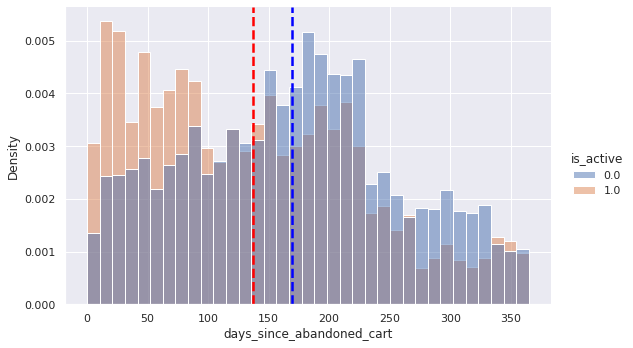

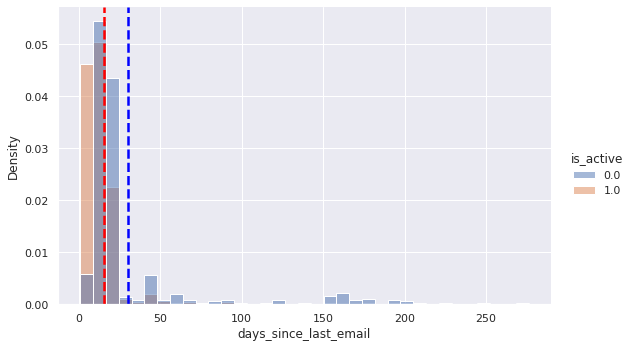

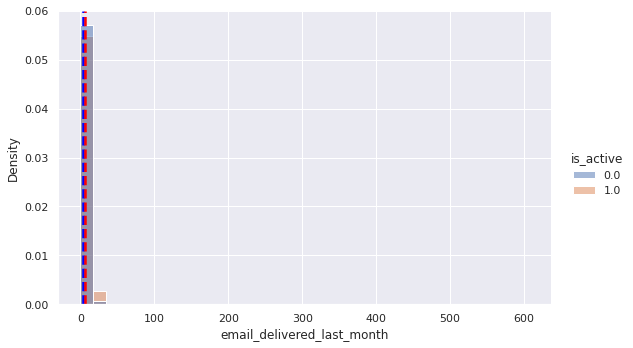

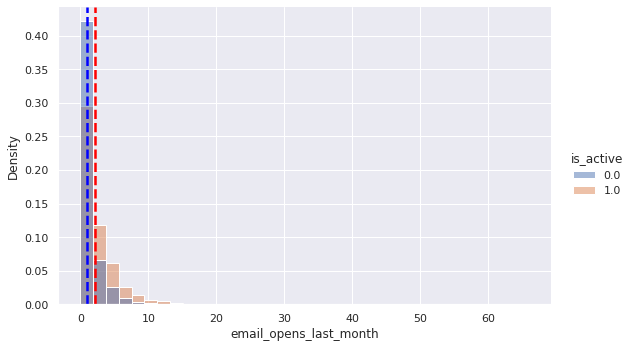

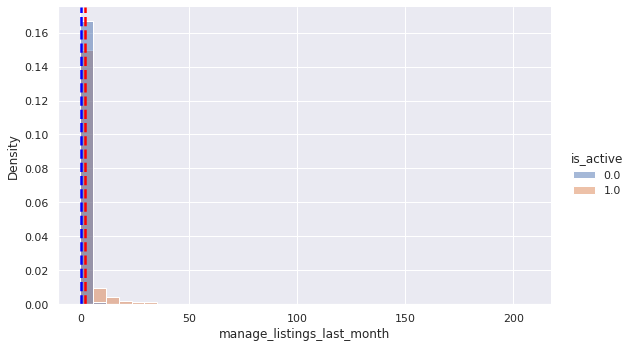

...

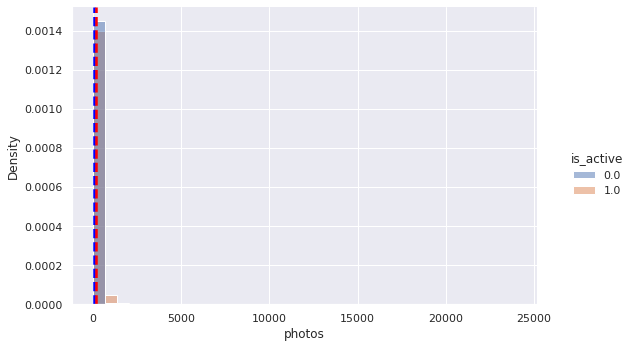

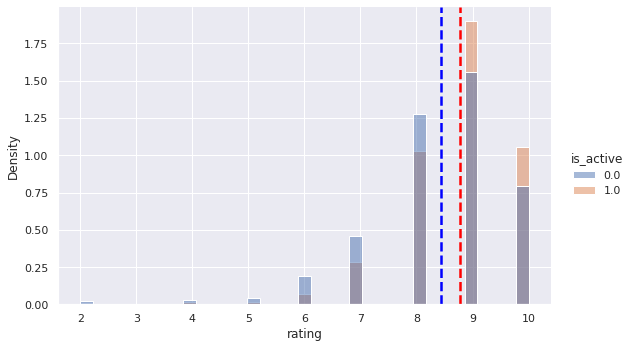

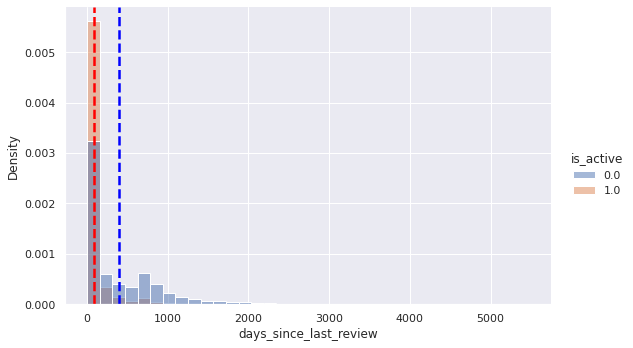

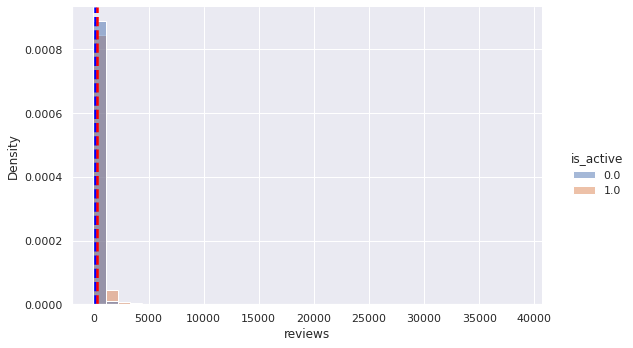

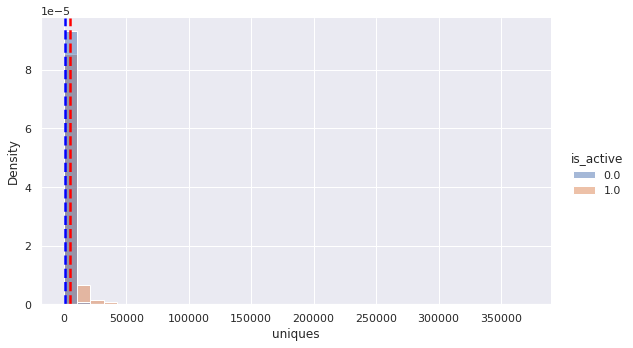

In [16]:
# plotting histograms as previously but segmented by 'is_active'
# common_norm=False, stat='density' as to normalize each histogram as we have
# large imbalance as previously mentioned
sns.set(rc={'figure.figsize':(16,9)})
for col in merged_df.columns.drop(['is_active']):
    if pd.api.types.is_numeric_dtype(merged_df[col].dtype):
        sns.displot(x=col, hue='is_active', common_norm=False, data=merged_df, bins=35, aspect=1.6, stat='density')
        plt.axvline(x=restaurants_df.loc[merged_df['is_active'] == 0][col].mean(),
        color='blue',
        ls='--', 
        lw=2.5)
        plt.axvline(x=restaurants_df.loc[merged_df['is_active'] == 1][col].mean(),
        color='red',
        ls='--', 
        lw=2.5)

/home/adrian/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


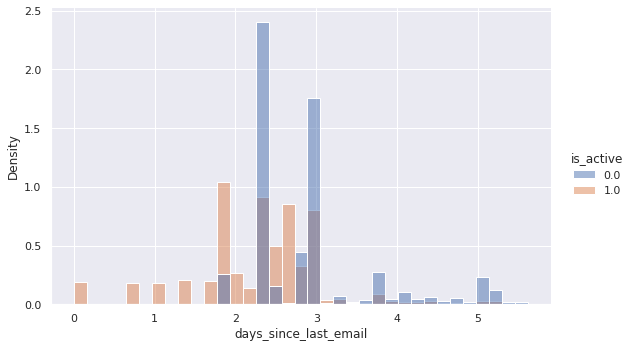

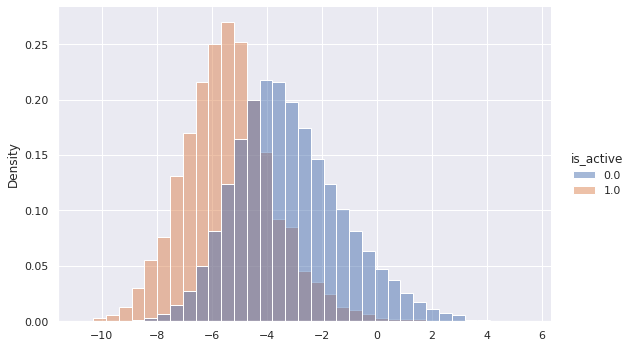

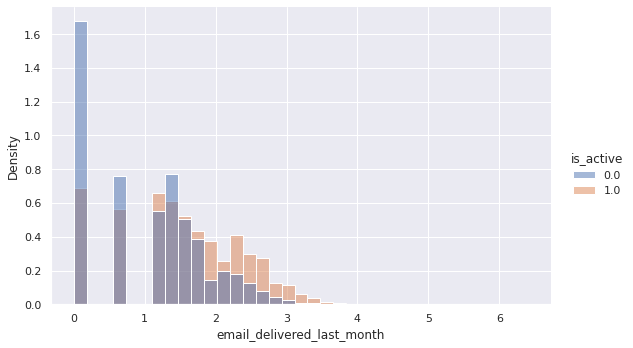

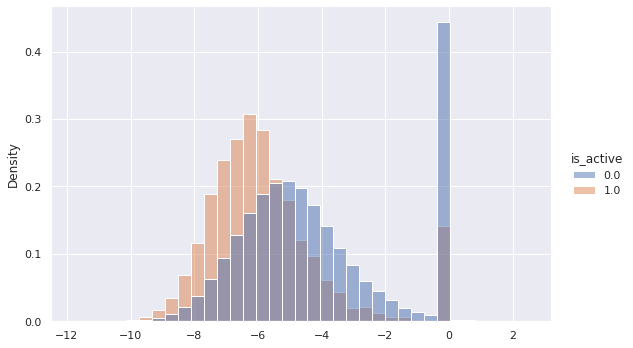

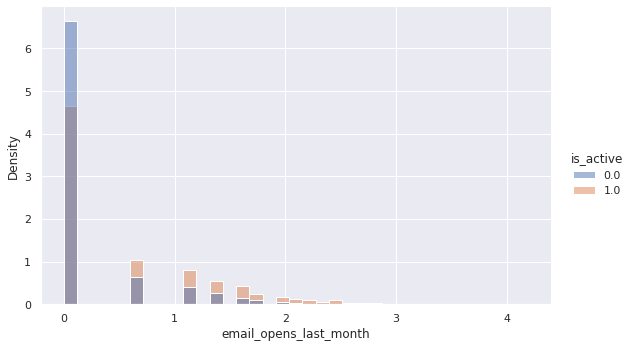

...

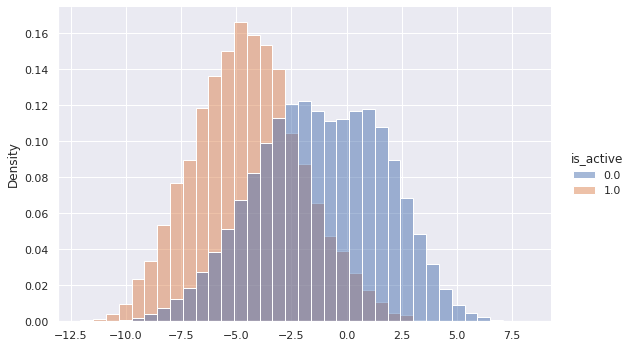

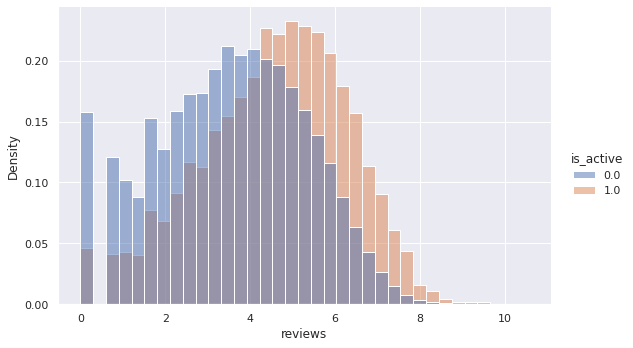

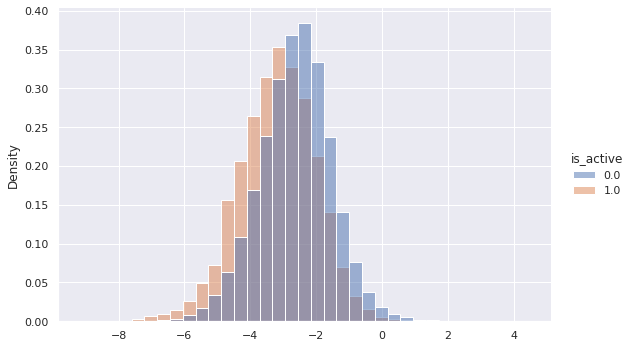

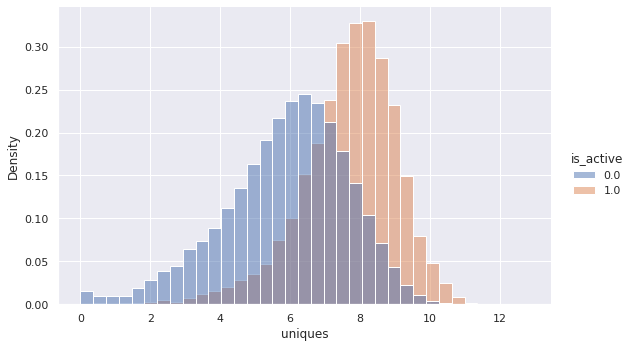

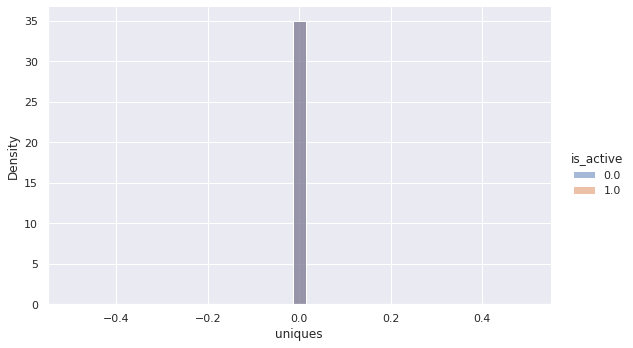

In [17]:
def log_over_zero(series, drop_zero=False):
    """ np.log for a pd.Series ignoring values <= 0
    """
    out = series.copy()
    out.loc[out > 0] = np.log(out.loc[out > 0])
    if drop_zero:
        return out.loc[out != 0]
    return out

# plotting log transformed long tailed variables
# also viewing /'uniques'
long_tailed_columns = ['days_since_last_email', 'email_delivered_last_month', 'email_opens_last_month', 'manage_listings_last_month', 'manage_photos_last_month', 'visitor_calls_last_month', 'visitor_reservations_last_month', 'visitor_saves_last_month', 'visitor_website_clicks_last_month', 'geo_rank', 'geo_rank_all', 'photos', 'days_since_last_review', 'reviews', 'uniques']

for col in long_tailed_columns:
    sns.displot(x=log_over_zero(merged_df[col]), hue=merged_df['is_active'], common_norm=False, bins=35, aspect=1.6, stat='density')
    sns.displot(x=log_over_zero(merged_df[col]/merged_df['uniques']), hue=merged_df['is_active'], common_norm=False, bins=35, aspect=1.6, stat='density')

- We do some distribution differences between is_active=0 and is_active=1. Although some variables are dominated by 0 values and may be dropped.

- Using log transformation some variables get closer to a normal distribution which should help learning for some algorithms. Also distribution differences become more pronounced.

- Variables are also brought to normal by dividing by 'uniques' and log transform (excluding zero values), ['days_since_last_email', 'email_deliveted_last_month', 'email_opens_last_month', 'manage_photos_last_month', 'visitor_calls_last_month', 'geo_rank', 'geo_rank_all', 'days_since_last_review', 'reviews'] show visibly different mean values with 'is_active'=1 

<AxesSubplot:>

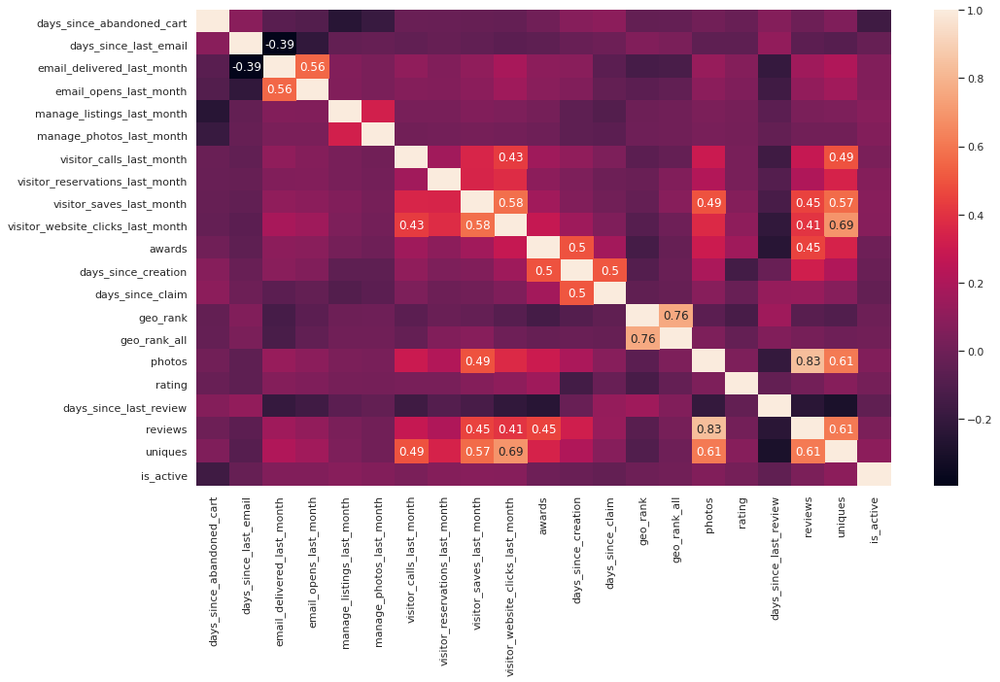

In [18]:
# correlation heatmap
correlations = merged_df.select_dtypes(include=np.number).corr()
filtered_correlations = correlations[((correlations >= .4) | (correlations <= -.3)) & (correlations !=1.000)]
sns.heatmap(correlations)
sns.heatmap(filtered_correlations, annot=True, vmin=correlations.unstack().min(), vmax=correlations.unstack().max(), cbar=False)

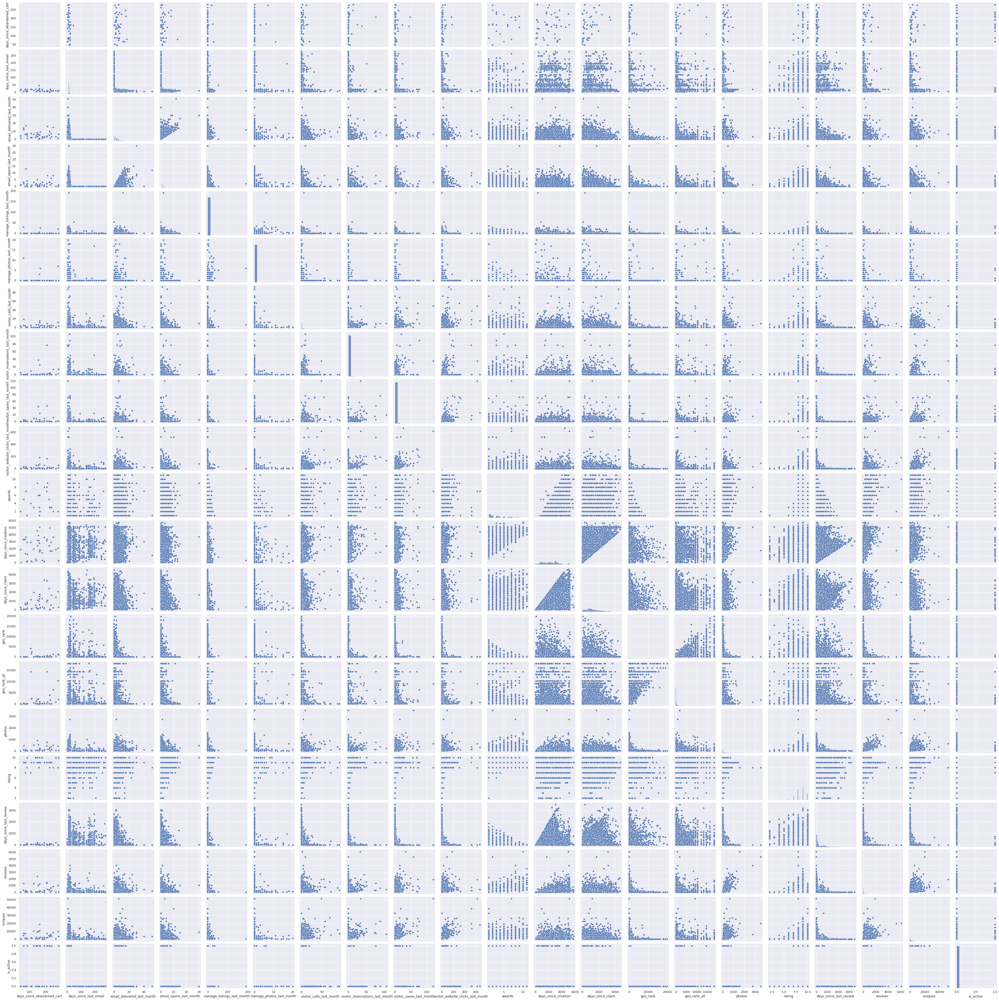

In [19]:
# pairplot, sampled rows to reduce compute speed 0.005 -> 6063 rows
sns.pairplot(merged_df.select_dtypes(include=np.number).sample(frac=0.005))

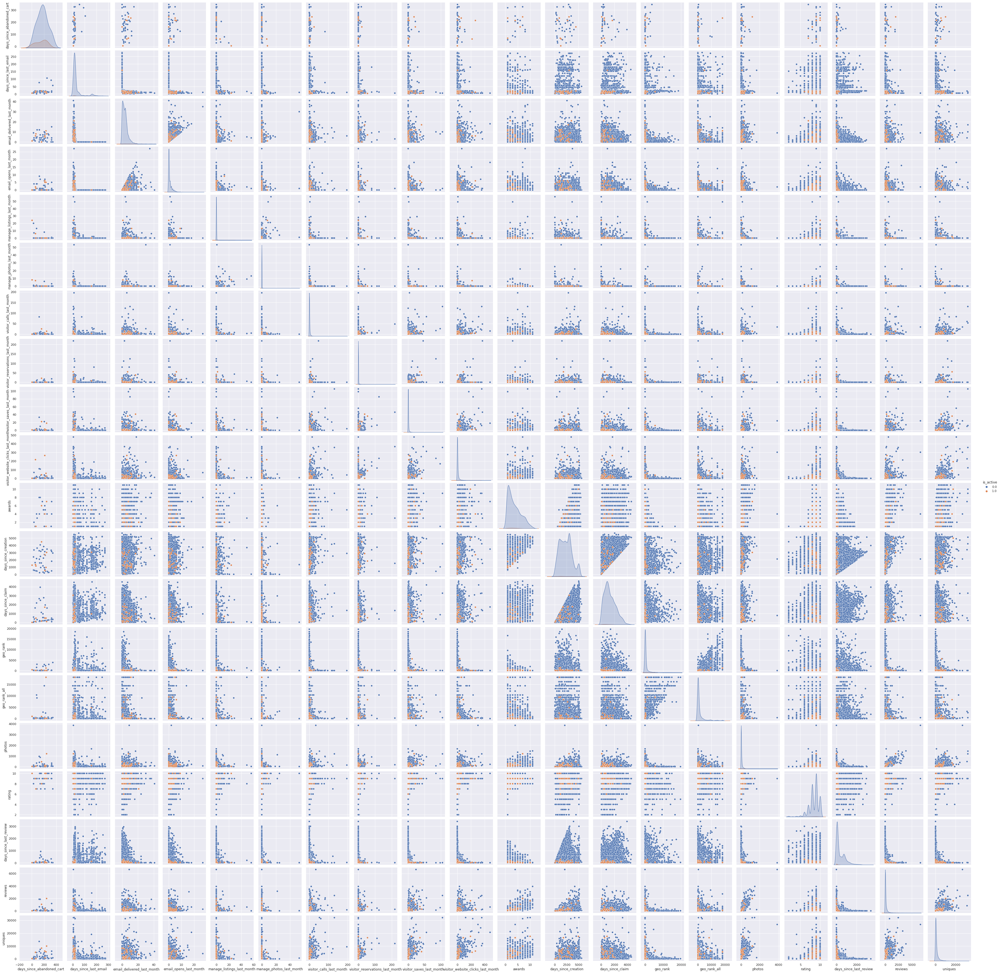

In [20]:
# also view pairplots with highlighting with 'is_active'
sns.pairplot(merged_df.select_dtypes(include=np.number).sample(frac=0.005).sort_values(by='is_active'), hue='is_active')

- Notice 'photos', 'reviews' and 'uniques' have high correlations with each other.

- Notice correlations between 'uniques', 'visitor_website_clicks_last_month', and 'visitor_saves_last_month'.

- At feature generation stage it may be worth dividing these highly correlated variables with 'uniques'. Creating a rate per unique may be informative.

- Notice high corerlation with 'geo_rank' and 'geo_rank_all', there may be redundancy in these variables.

- Notice correlation between 'days_since_creation' and 'days_since_claim', it may be understandable that an owner claims a listing soon after being created.

- Most in the pairplots show no interesting patterns, although we may verify 'email_deliveryed_last_month' > 'email_opens_last_month'. We can also see the general positive correlations with 'uniques' as previously mentioned and others.

- By eye we see that 'days_since_last_review', 'geo_rank', 'geo_rank_all' tend to be lower for 'is_active' = 1. Other patterns are difficult to see by plots and two-sample tests and other techniques may be more useful.


# Feature Engineering and Feature Selection

## Encoding

- Missing encoding
    - For numerical we may fill with mean or median; median should be more suitable due to outliers. We may also use a multivariate imputer to impute values as estimates from other features. We may also simply encode the missing value as a number out of range.
    - For categorical we may fill with mode, or similarly multivariate imputer. We also may encode missing a new category.

- Location mapping
    - We may find lat/lon of locations.

- Transformations
    - Divide by 'uniques' for 'uniques' rate, if more time available it may be worth testing other combinations and feature crossing.
    - Log transform; as we see many features with long-tailed distribution.

- Categorical encoding
    - Hash trick encoding is useful for large cardinality categorical features which may also introduce new values e.g. a country we haven't seen in historical data appears later.
    - One hot encoding; for continent as there is only a low amount we can use one-hot-encoding

- Discretization
    - Some numerical columns may benefit by explicitly discretizing.

- Date decomposition
    - Day of month, Day of week
    - ds has already been dropped, we do not have other datetime columns. Date decomposition no longer needs to be considered.


In [21]:
# display null segemented on is_active
null_df = pd.concat([merged_df.isnull().sum()/merged_df.shape[0],
merged_df.loc[merged_df['is_active'] == 0].isnull().sum()/(merged_df['is_active'] == 0).sum(),
merged_df.loc[merged_df['is_active'] == 1].isnull().sum()/(merged_df['is_active'] == 1).sum()], axis=1)
null_df.columns = ['', 'is_active=0', 'is_active=1']
null_df

,,is_active=0,is_active=1
continent,0.000000,0.000000,0.000000
country,0.001630,0.001627,0.002082
days_since_abandoned_cart,0.991594,0.993990,0.562017
days_since_last_email,0.287866,0.289034,0.078525
email_delivered_last_month,0.287883,0.289050,0.078525
email_opens_last_month,0.287883,0.289050,0.078525
manage_listings_last_month,0.099398,0.099922,0.005503
manage_photos_last_month,0.099398,0.099922,0.005503
visitor_calls_last_month,0.005623,0.005655,0.000000
visitor_reservations_last_month,0.005623,0.005655,0.000000


In [22]:
# fillna numerical columns with -1
categorical_columns = ['continent', 'country']
num_cols = merged_df.columns.drop(categorical_columns)
merged_df[num_cols] = merged_df[num_cols].fillna(-1) # we can use -1 as missing as values are >0 for columns with missing values
# fillna categorical columns with 'na'

In [23]:
# Using geonames to get lat/lon, I acknowledge incorrect co-ordinates may occur
from geopy import geocoders
gn = geocoders.GeoNames(username='adrianliu')
# replace United States with North America / South America for GeoNames
merged_df['country'].loc[merged_df['country'] == 'United States'] = merged_df['continent'].loc[merged_df['country'] == 'United States']

/home/adrian/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [24]:
# mapping lat long
country_latlon_dict = {country:gn.geocode(country)[1] for country in merged_df['country'].unique()}
merged_df['country_lat'] = merged_df['country'].apply(lambda x: country_latlon_dict[x][0])
merged_df['country_lon'] = merged_df['country'].apply(lambda x: country_latlon_dict[x][1])
merged_df[categorical_columns] = merged_df[categorical_columns].fillna('na')

In [25]:
# log transformation
# divide by uniques
# long_tailed_columns
unique_rate_columns = ['days_since_last_email', 'email_delivered_last_month', 'email_opens_last_month', 'manage_photos_last_month', 'visitor_calls_last_month', 'geo_rank', 'geo_rank_all', 'days_since_last_review', 'reviews']
unique_rates_df = merged_df[unique_rate_columns].apply(lambda x: log_over_zero(x/merged_df['uniques']), axis=0)
unique_rates_df.columns = [f'{col}_uniques_rate' for col in unique_rates_df.columns]
merged_df = pd.concat([merged_df, unique_rates_df], axis=1)

merged_df[long_tailed_columns] = merged_df[long_tailed_columns].apply(lambda x: log_over_zero(x), axis=1)

In [26]:
# feature hasher, country
from sklearn.feature_extraction import FeatureHasher

country_hasher = FeatureHasher(n_features=4, input_type='string') # I select n_features=4, if more time crossvalidating a more optimal number would be preferred
hashed_country = country_hasher.fit_transform(merged_df['country'])
hashed_country_array = hashed_country.toarray()
for i in range(hashed_country_array.shape[1]):
    merged_df[f'hashed_country_{i}'] = hashed_country_array[:, i]

# one hot encoding, continent
continent_dummies = pd.get_dummies(merged_df['continent'])
merged_df = pd.concat([merged_df, continent_dummies], axis=1)

merged_df = merged_df.drop(columns=['continent', 'country'])

- We actually notice that when 'is_active=1' missing counts are reduced; thus I decide to encode when variables are missing.

## Feature Selection

- L1-based SVC
- Random Forest feature importance, other tree based algorithms could have also been used

In [27]:
X, y = merged_df.drop(columns='is_active'), merged_df['is_active']

/home/adrian/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


<AxesSubplot:>

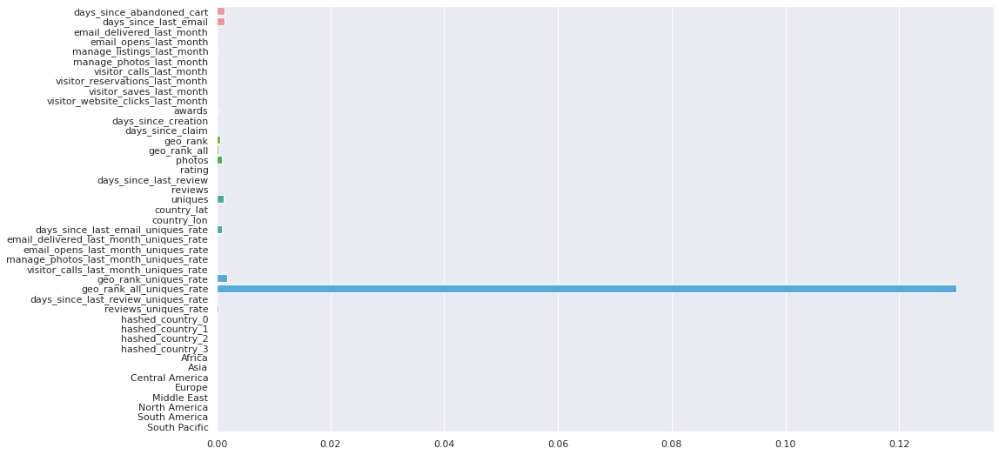

In [28]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

lsvc = LinearSVC(penalty='l1', dual=False)
lsvc.fit(X_scaled, y)
sns.barplot(y=X.columns, x=lsvc.coef_[0]**2)

<AxesSubplot:>

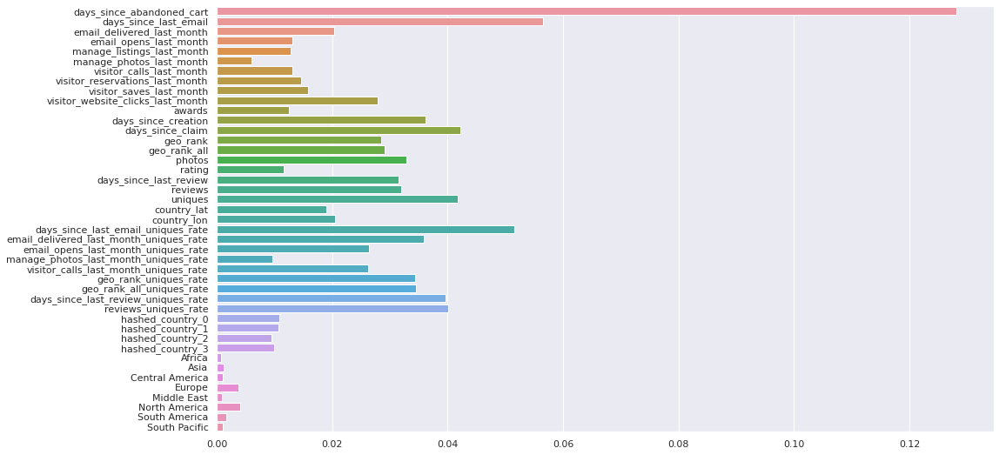

In [29]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier()
rfc.fit(X, y)
sns.barplot(y=X.columns, x=rfc.feature_importances_)

In [30]:
importances = pd.DataFrame({'variable': X.columns, 'l1_coef': lsvc.coef_[0]**2, 'rf_imp': rfc.feature_importances_})
importances['l1_coef_rank'] = importances['l1_coef'].rank(ascending=False)
importances['rf_imp_rank'] = importances['rf_imp'].rank(ascending=False)
importances

,variable,l1_coef,rf_imp,l1_coef_rank,rf_imp_rank
0,days_since_abandoned_cart,1.337535e-03,0.128166,4.0,1.0
1,days_since_last_email,1.408720e-03,0.056575,3.0,2.0
2,email_delivered_last_month,5.692337e-06,0.020287,34.0,21.0
3,email_opens_last_month,6.923466e-05,0.013154,16.0,26.0
4,manage_listings_last_month,1.045945e-04,0.012844,12.0,27.0
5,manage_photos_last_month,7.714929e-05,0.006014,14.0,35.0
6,visitor_calls_last_month,4.274552e-05,0.013186,20.0,25.0
7,visitor_reservations_last_month,7.821067e-05,0.014558,13.0,24.0
8,visitor_saves_last_month,2.274953e-05,0.015886,25.0,23.0
9,visitor_website_clicks_last_month,4.835405e-05,0.027829,18.0,17.0


In [31]:
importances['rank_total'] = importances['l1_coef_rank'] + importances['rf_imp_rank']
display(importances.sort_values('rank_total'))

,variable,l1_coef,rf_imp,l1_coef_rank,rf_imp_rank,rank_total
0,days_since_abandoned_cart,1.337535e-03,0.128166,4.0,1.0,5.0
1,days_since_last_email,1.408720e-03,0.056575,3.0,2.0,5.0
22,days_since_last_email_uniques_rate,9.655095e-04,0.051485,6.0,3.0,9.0
19,uniques,1.207531e-03,0.041693,5.0,5.0,10.0
28,geo_rank_all_uniques_rate,1.300957e-01,0.034600,1.0,10.0,11.0
27,geo_rank_uniques_rate,1.782198e-03,0.034319,2.0,11.0,13.0
30,reviews_uniques_rate,3.217011e-04,0.040059,9.0,6.0,15.0
15,photos,9.390521e-04,0.032930,7.0,12.0,19.0
12,days_since_claim,4.683645e-05,0.042141,19.0,4.0,23.0
13,geo_rank,6.335931e-04,0.028486,8.0,16.0,24.0


In [32]:
to_drop = (importances['l1_coef'] <= 1e-6) | (importances['rf_imp'] <= 0.001)
to_drop.sum()

7

Both these methods have general correlation with how it would rank the features. I think may experiment with remove the features which rank the worst.

I set thresholds to select for features, if more time afforded it may have been better to do a search for a better threshold values.

# Modelling

We have the data for a single point in time containing some relevant information of a restaurant and also the status if they are a premium subscriber at that point in time.

We are trying to predict properties which are more likely to purchase that premium subscription. It can be treated like a classification task, we use the historical data and learn to classify historical premium subscriptions and would be predicting on unseen data.

I choose Random Forest i.e. tree-based method as we know we have we have large number of observations, and relationship between features and target variable may not be linear. It may be best practice to do a grid search.

- Train/test split
    - I do not notice any variables to stratisfy. I also do not notice variables which may cause leakage because of splitting. Thus I may use random sampling.
    - I will use stratified k-fold cross-validation as a better indication of the model's generlisability.

- Oversampling/Undersampling
    - SMOTE allows to sythetically increase dataset size.

In [33]:
# baseline
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

skf = StratifiedKFold(n_splits=5, shuffle=True)
models = []
metrics = {'accuracy': [], 'f1':[], 'precision':[], 'recall': []}
for train_index, test_index in skf.split(X, y):
    rf = RandomForestClassifier()
    x_train_fold, x_test_fold = X.iloc[train_index, :], X.iloc[test_index, :]
    y_train_fold, y_test_fold = y[train_index], y[test_index]
    rf.fit(x_train_fold, y_train_fold)
    pred = rf.predict(x_test_fold)
    models.append(rf)
    scores = precision_recall_fscore_support(y_test_fold, pred)
    metrics['accuracy'].append(accuracy_score(y_test_fold, pred))
    metrics['precision'].append(scores[0])
    metrics['recall'].append(scores[1])
    metrics['f1'].append(scores[2])

display(pd.DataFrame(metrics))


,accuracy,f1,precision,recall
0,0.994903,"[0.9974432699666963, 0.20667522464698332]","[0.995113112460325, 0.755868544600939]","[0.9997843656826277, 0.11970260223048328]"
1,0.994903,"[0.9974432911214355, 0.20463320463320464]","[0.9951049383989929, 0.7607655502392344]","[0.999792659310219, 0.11821561338289963]"
2,0.994932,"[0.9974577445705574, 0.21167415009621554]","[0.9951296021132574, 0.7710280373831776]","[0.9997968061240146, 0.12267657992565056]"
3,0.994899,"[0.9974412384654049, 0.2024500322372663]","[0.9950967443703361, 0.7621359223300971]","[0.9997968061240146, 0.11672862453531599]"
4,0.994829,"[0.9974060145709995, 0.19615384615384615]","[0.9950841392290642, 0.7083333333333334]","[0.9997387507308759, 0.11383928571428571]"


In [34]:
# feature selection
skf = StratifiedKFold(n_splits=5, shuffle=True)
models = []
metrics = {'accuracy': [], 'f1':[], 'precision':[], 'recall': []}
for train_index, test_index in skf.split(X, y):
    rf = RandomForestClassifier()
    x_train_fold, x_test_fold = X.iloc[train_index, :].loc[:, (~to_drop).tolist()], X.iloc[test_index, :].loc[:, (~to_drop).tolist()]
    y_train_fold, y_test_fold = y[train_index], y[test_index]
    rf.fit(x_train_fold, y_train_fold)
    pred = rf.predict(x_test_fold)
    models.append(rf)
    scores = precision_recall_fscore_support(y_test_fold, pred)
    metrics['accuracy'].append(accuracy_score(y_test_fold, pred))
    metrics['precision'].append(scores[0])
    metrics['recall'].append(scores[1])
    metrics['f1'].append(scores[2])

display(pd.DataFrame(metrics))

,accuracy,f1,precision,recall
0,0.994882,"[0.997432560756867, 0.2372464658881377]","[0.995243835978399, 0.6843971631205674]","[0.9996309335721898, 0.14349442379182156]"
1,0.994808,"[0.9973956124654799, 0.1996185632549269]","[0.9950962991092436, 0.6885964912280702]","[0.9997055762205109, 0.11672862453531599]"
2,0.994952,"[0.9974679354571784, 0.2292191435768262]","[0.9951991942241725, 0.7489711934156379]","[0.9997470443584672, 0.13531598513011153]"
3,0.994928,"[0.997455397040813, 0.2369727047146402]","[0.9952358737878106, 0.7153558052434457]","[0.9996848421515329, 0.14200743494423793]"
4,0.994952,"[0.9974676525718638, 0.25365853658536586]","[0.9953096033394303, 0.7027027027027027]","[0.9996350803859855, 0.15476190476190477]"


In [35]:
# oversampling
from imblearn.over_sampling import SMOTE

skf = StratifiedKFold(n_splits=2, shuffle=True) # reduce splits saving compute time
models = []
metrics = {'accuracy': [], 'f1':[], 'precision':[], 'recall': []}
for train_index, test_index in skf.split(X, y):
    oversample = SMOTE()
    rf = RandomForestClassifier()
    x_train_fold, x_test_fold = X.iloc[train_index, :].loc[:, (~to_drop).tolist()], X.iloc[test_index, :].loc[:, (~to_drop).tolist()]
    y_train_fold, y_test_fold = y[train_index], y[test_index]
    x_train_fold, y_train_fold = oversample.fit_resample(x_train_fold, y_train_fold)
    rf.fit(x_train_fold, y_train_fold)
    pred = rf.predict(x_test_fold)
    models.append(rf)
    scores = precision_recall_fscore_support(y_test_fold, pred)
    metrics['accuracy'].append(accuracy_score(y_test_fold, pred))
    metrics['precision'].append(scores[0])
    metrics['recall'].append(scores[1])
    metrics['f1'].append(scores[2])

display(pd.DataFrame(metrics))

,accuracy,f1,precision,recall
0,0.994329,"[0.9971519317656532, 0.35569715142428787]","[0.9960066924722926, 0.4807497467071935]","[0.9982998077538718, 0.2822724568709102]"
1,0.994420,"[0.9971977054815796, 0.3547587259202747]","[0.9959758617893847, 0.4944178628389155]","[0.9984225507238684, 0.2766210588935158]"


In [47]:
proba_pred = rf.predict_proba(x_test_fold)

In [67]:
proba_pred_df = pd.DataFrame({'0_pred': proba_pred[:, 0], '1_pred': proba_pred[:, 1], 'truth': y_test_fold}).reset_index()
proba_pred_df = proba_pred_df.loc[proba_pred_df['truth'] == 1].sort_values('1_pred')
proba_pred_df

,index,0_pred,1_pred,truth
253464,506648,1.00,0.00,1.0
462385,924866,1.00,0.00,1.0
462659,925424,1.00,0.00,1.0
209517,419325,1.00,0.00,1.0
463009,926145,1.00,0.00,1.0
...,...,...,...,...
50552,101569,0.03,0.97,1.0
234482,468933,0.02,0.98,1.0
55387,111329,0.02,0.98,1.0
8289,16609,0.01,0.99,1.0


In [71]:
# look at prediction examples
pd.set_option('display.max_colwidth', None)
bad_pred = x_test_fold.iloc[proba_pred_df.index[:5], :]
good_pred = x_test_fold.iloc[proba_pred_df.index[-5:], :]
display(bad_pred)
display(good_pred)

,days_since_abandoned_cart,days_since_last_email,email_delivered_last_month,email_opens_last_month,manage_listings_last_month,manage_photos_last_month,visitor_calls_last_month,visitor_reservations_last_month,visitor_saves_last_month,visitor_website_clicks_last_month,...,geo_rank_all_uniques_rate,days_since_last_review_uniques_rate,reviews_uniques_rate,hashed_country_0,hashed_country_1,hashed_country_2,hashed_country_3,Asia,Central America,North America
506648,-1.0,3.713572,0.000000,0.000000,1.945910,0.0,1.791759,0.0,0.00000,1.609438,...,-6.004710,-5.656403,-2.578820,0.0,1.0,0.0,3.0,0,0,0
924866,-1.0,2.397895,1.609438,1.386294,1.098612,0.0,0.000000,0.0,0.00000,3.218876,...,-5.969475,-3.941326,-2.326639,2.0,-1.0,2.0,0.0,0,0,1
925424,-1.0,2.397895,0.693147,0.000000,0.000000,0.0,0.000000,0.0,0.00000,0.000000,...,5.164293,2.471891,-3.367296,0.0,-3.0,2.0,1.0,1,0,0
419325,-1.0,2.397895,1.609438,0.693147,0.000000,0.0,0.693147,0.0,0.00000,1.609438,...,-5.410157,-2.897851,-2.465718,-2.0,-1.0,0.0,0.0,0,0,0
926145,-1.0,5.187386,0.000000,0.000000,0.000000,0.0,1.098612,0.0,1.94591,3.871201,...,-0.538320,-6.480881,-2.296751,2.0,0.0,0.0,0.0,0,0,0


,days_since_abandoned_cart,days_since_last_email,email_delivered_last_month,email_opens_last_month,manage_listings_last_month,manage_photos_last_month,visitor_calls_last_month,visitor_reservations_last_month,visitor_saves_last_month,visitor_website_clicks_last_month,...,geo_rank_all_uniques_rate,days_since_last_review_uniques_rate,reviews_uniques_rate,hashed_country_0,hashed_country_1,hashed_country_2,hashed_country_3,Asia,Central America,North America
101569,89.0,2.302585,1.386294,0.000000,0.000000,0.0,1.609438,0.000000,1.791759,3.178054,...,-2.607543,-7.378228,-2.950391,1.0,-1.0,0.0,0.0,0,0,0
468933,22.0,1.386294,1.386294,1.386294,2.708050,0.0,1.609438,2.995732,2.079442,3.178054,...,-0.895036,-6.386037,-2.859677,0.0,-2.0,1.0,3.0,0,0,1
111329,51.0,1.098612,2.708050,1.609438,0.000000,0.0,1.945910,0.000000,1.386294,2.890372,...,-3.822914,-5.597866,-3.112960,1.0,-1.0,0.0,0.0,0,0,0
16609,128.0,1.609438,1.791759,1.386294,0.000000,0.0,1.386294,2.484907,1.386294,2.772589,...,0.069951,-4.455454,-4.003469,-2.0,-1.0,0.0,0.0,0,0,0
7560,89.0,2.302585,1.609438,1.386294,1.609438,0.0,2.079442,0.000000,2.484907,2.833213,...,-3.278468,-6.628372,-3.154854,1.0,-1.0,0.0,0.0,0,0,0


In [75]:
pd.concat([bad_pred.mean(), good_pred.mean()], axis=1)

,0,1
days_since_abandoned_cart,-1.000000,75.800000
days_since_last_email,3.218929,1.739903
email_delivered_last_month,0.782405,1.776367
email_opens_last_month,0.415888,1.153664
manage_listings_last_month,0.608904,0.863498
manage_photos_last_month,0.000000,0.000000
visitor_calls_last_month,0.716704,1.726104
visitor_reservations_last_month,0.000000,1.096128
visitor_saves_last_month,0.389182,1.825739
visitor_website_clicks_last_month,2.061791,2.970456


In [64]:
x_test_fold.shape

(606234, 36)

In [41]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test_fold, pred)
cm

array([[601921,    951],
       [  2432,    930]])

<AxesSubplot:>

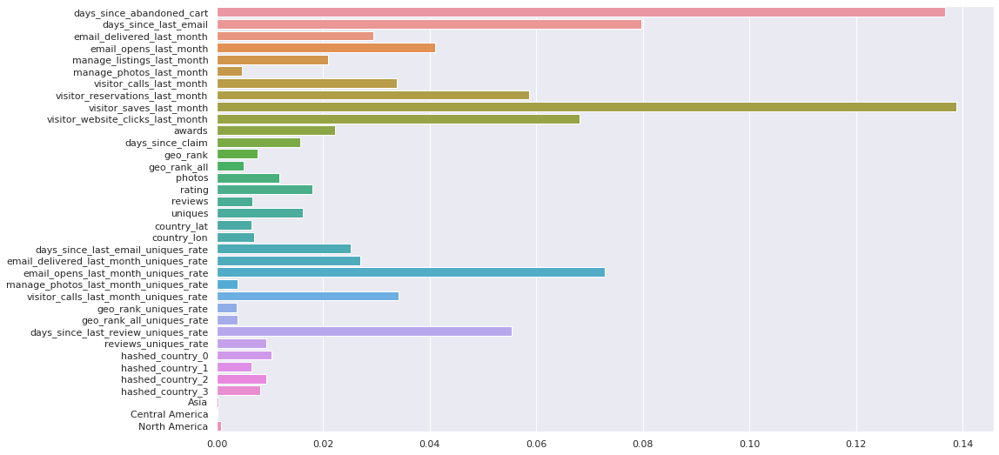

In [45]:
# feature importance
sns.barplot(x=rf.feature_importances_, y=X.loc[:, (~to_drop).tolist()].columns)

We see generally poor performance, the model has not been able to learn for the 'is_active'=1 class. We see improvements with all metrics with feature selection, and improvements with recall and f1 but reduction in precision with SMOTE.

Looking at examples of where the model predicts well and poorly, there are differences for the when it predicts well such as; non-missing values for 'days_since_abandoned_cart', lower 'days_since_last_email', higher 'email_deliverted_last_month', 'visitor_saves_last_month', 'visitor_calls_last_month'. Most of these metrics seem to be also indicators for when a restaurant is doing well on TripAdvisor in general. i.e. restaurants that are doing well is a noticeable indicator for if they have a premium subscription. But as we see, restaurants that have are performing poorly also get the premium subscription (possibly to improve), but likely a lower proportion. A feature such as how long they have been subscribed for may explain some of this difference.

There are some things I may try if I had more time:

- I notice feature importance for two of the unique rates features is noticeable, there may be other combinations of features I could experiment with e.g. 'reviews', 'photos'. 

- Feature importance for the hashed countries is relatively low, although not dropped at feature selection. The value use for 'n_features' may be tweaked, or another encoding method may have been suitable.

- Thresholds for feature selection itself may be tweaked, as we saw improvement already there may be more left on the table.

- We are running into an underfitting problem, models more known to fit more complicated patterns such as gradient boosted trees or deep learning may be more suitable.